<a href="https://colab.research.google.com/github/hiudymartinhagocarvalho/PREVISAO-DE-S-RIES-TEMPORAIS-BASEADA-EM-MODELO-NEURAL-PROPHET/blob/main/Pibic2024.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **PROPHET**

In [2]:
import sys
print(sys.version)



3.10.12 (main, Nov 20 2023, 15:14:05) [GCC 11.4.0]


# **Bibliotecas**

In [4]:
pip install prophet

In [5]:
pip install pyInterDemand

In [6]:
pip install plotly

In [7]:
from prophet import Prophet
from google.colab import drive
drive.mount('/content/drive')

#site do banco de dados
#https://www.kaggle.com/datasets/mubashirrahim/wind-power-generation-data-forecasting?resource=download

Mounted at /content/drive


# **Preparação**

In [46]:
import pandas as pd
from pandas import read_excel
from pandas import DataFrame
import matplotlib.pyplot as plt
import warnings
from math import sqrt
from prophet import Prophet
import numpy as np
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

#series = pd.read_excel('/content/drive/MyDrive/archive/eolica.xlsx' ,header=None, parse_dates=True, index_col=0).squeeze(1)
#series = pd.read_csv('/content/drive/MyDrive/archive/eolica.csv' ,header=0, parse_dates=True, index_col=0).squeeze(1)
series = pd.read_csv('/content/drive/MyDrive/archive/data.csv' ,header=0, parse_dates=True, index_col=0).squeeze(1)

# Exibindo os dados do arquivo
series


Time
2011-01-01 00:00:00    3416.00
2011-01-01 00:15:00    4755.00
2011-01-01 00:30:00    4939.00
2011-01-01 00:45:00    4939.00
2011-01-01 01:00:00    4998.00
                        ...   
2021-12-30 06:45:00    8140.31
2021-12-30 07:00:00    8162.33
2021-12-30 07:15:00    8405.11
2021-12-30 07:30:00    8503.48
2021-12-30 07:45:00    8403.53
Name: MW, Length: 385566, dtype: float64

In [47]:
series = series.reset_index(drop=False)
series.index = series.index.astype(int)

# Convertendo a coluna 'date' para o tipo datetime
series['date'] = pd.to_datetime(series['Time'])

# Definindo a coluna 'date' como o índice do DataFrame
series.set_index('date', inplace=True)

series.drop(columns=['Time'], inplace=True)


series

,MW
date,
2011-01-01 00:00:00,3416.00
2011-01-01 00:15:00,4755.00
2011-01-01 00:30:00,4939.00
2011-01-01 00:45:00,4939.00
2011-01-01 01:00:00,4998.00
...,...
2021-12-30 06:45:00,8140.31
2021-12-30 07:00:00,8162.33
2021-12-30 07:15:00,8405.11


(array([-2500.,     0.,  2500.,  5000.,  7500., 10000., 12500., 15000.,
        17500., 20000.]),
 [Text(0, -2500.0, '−2500'),
  Text(0, 0.0, '0'),
  Text(0, 2500.0, '2500'),
  Text(0, 5000.0, '5000'),
  Text(0, 7500.0, '7500'),
  Text(0, 10000.0, '10000'),
  Text(0, 12500.0, '12500'),
  Text(0, 15000.0, '15000'),
  Text(0, 17500.0, '17500'),
  Text(0, 20000.0, '20000')])

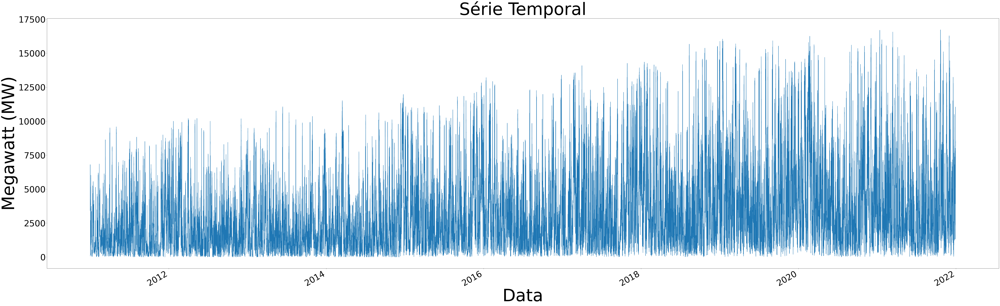

In [48]:
import matplotlib.pyplot as plt
series.plot(kind='line',figsize=(100,30))
plt.title("Série Temporal",fontsize = 100)
plt.xlabel('Data',fontsize = 100)
plt.ylabel('Megawatt (MW)',fontsize = 100)
plt.legend().remove()
plt.xticks(fontsize = 50)
plt.yticks(fontsize = 50)

array([<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >], dtype=object)

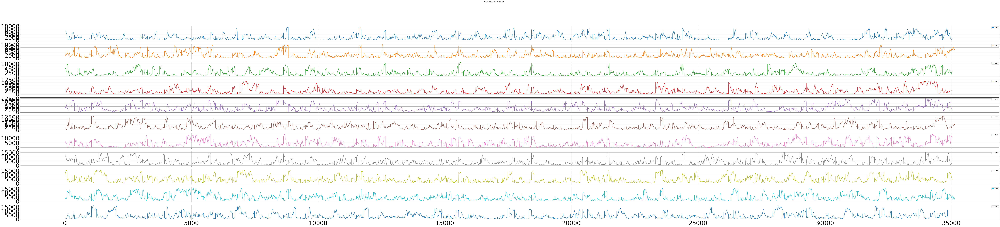

In [49]:
from pandas import concat
from pandas import Grouper,Series

groups = series.groupby(Grouper(freq='A'))

years = concat([Series(x.values.flatten(), name=y)
                   for y,x in groups],
                  axis=1)

#years.columns=['2017','2018','2019','2020','2021']
years.columns = ['2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021']
years.plot(subplots=True, title='Série Temporal de cada ano',figsize=(150,30),grid=True,fontsize=50)

In [50]:
tam = len(series)
tam

385566

In [52]:
series = series.resample('1H').mean()
series

,MW
date,
2011-01-01 00:00:00,4512.2500
2011-01-01 01:00:00,5240.2500
2011-01-01 02:00:00,5630.2500
2011-01-01 03:00:00,6017.7500
2011-01-01 04:00:00,6357.0000
...,...
2021-12-30 03:00:00,6274.9800
2021-12-30 04:00:00,6865.0150
2021-12-30 05:00:00,7829.0325


In [53]:
series.replace(0, np.nan, inplace=True)

# Removendo as linhas com valores nulos
series = series.dropna()

series

,MW
date,
2011-01-01 00:00:00,4512.2500
2011-01-01 01:00:00,5240.2500
2011-01-01 02:00:00,5630.2500
2011-01-01 03:00:00,6017.7500
2011-01-01 04:00:00,6357.0000
...,...
2021-12-30 03:00:00,6274.9800
2021-12-30 04:00:00,6865.0150
2021-12-30 05:00:00,7829.0325


In [54]:
import pandas as pd


if series.isnull().values.any():
  print("O DataFrame contém valores NaN. Removendo linhas...")
  series = series.dropna()
  print("Linhas com valores NaN foram removidas.")
else:
  print("Não há valores NaN no DataFrame.")

series

Não há valores NaN no DataFrame.


,MW
date,
2011-01-01 00:00:00,4512.2500
2011-01-01 01:00:00,5240.2500
2011-01-01 02:00:00,5630.2500
2011-01-01 03:00:00,6017.7500
2011-01-01 04:00:00,6357.0000
...,...
2021-12-30 03:00:00,6274.9800
2021-12-30 04:00:00,6865.0150
2021-12-30 05:00:00,7829.0325


In [55]:
tam = len(series)
tam

96368

(array([-2500.,     0.,  2500.,  5000.,  7500., 10000., 12500., 15000.,
        17500.]),
 [Text(0, -2500.0, '−2500'),
  Text(0, 0.0, '0'),
  Text(0, 2500.0, '2500'),
  Text(0, 5000.0, '5000'),
  Text(0, 7500.0, '7500'),
  Text(0, 10000.0, '10000'),
  Text(0, 12500.0, '12500'),
  Text(0, 15000.0, '15000'),
  Text(0, 17500.0, '17500')])

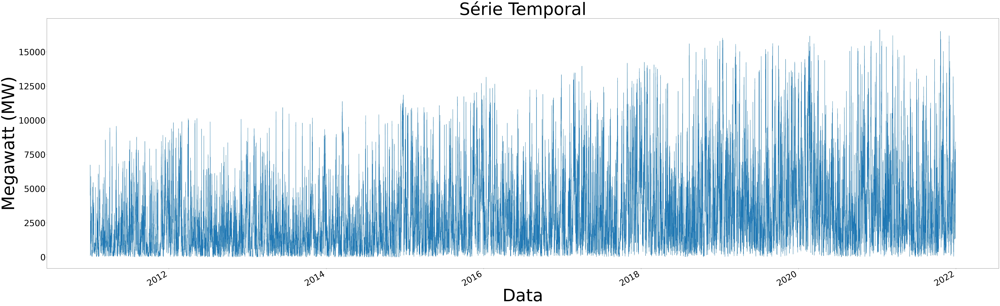

In [56]:
import matplotlib.pyplot as plt
series.plot(kind='line',figsize=(100,30))
plt.title("Série Temporal",fontsize = 100)
plt.xlabel('Data',fontsize = 100)
plt.ylabel('Megawatt (MW)',fontsize = 100)
plt.legend().remove()
plt.xticks(fontsize = 50)
plt.yticks(fontsize = 50)

In [57]:
import pandas as pd


if series.isnull().values.any():
  print("O DataFrame contém valores NaN. Removendo linhas...")
  series = series.dropna()
  print("Linhas com valores NaN foram removidas.")
else:
  print("Não há valores NaN no DataFrame.")

series

Não há valores NaN no DataFrame.


,MW
date,
2011-01-01 00:00:00,4512.2500
2011-01-01 01:00:00,5240.2500
2011-01-01 02:00:00,5630.2500
2011-01-01 03:00:00,6017.7500
2011-01-01 04:00:00,6357.0000
...,...
2021-12-30 03:00:00,6274.9800
2021-12-30 04:00:00,6865.0150
2021-12-30 05:00:00,7829.0325


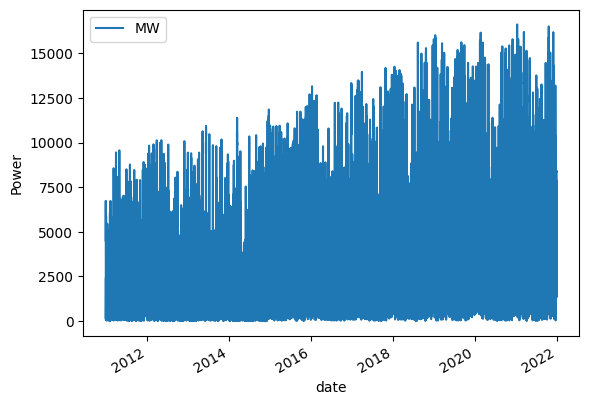

In [58]:
ax = series.plot()
ax.set_ylabel('Power')
plt.show()

In [59]:
series = series.reset_index(drop=False)
series.index = series.index.astype(int)

series.rename(columns={'date': 'ds'}, inplace=True)
series.rename(columns={'MW': 'y'}, inplace=True)
series

,ds,y
0,2011-01-01 00:00:00,4512.2500
1,2011-01-01 01:00:00,5240.2500
2,2011-01-01 02:00:00,5630.2500
3,2011-01-01 03:00:00,6017.7500
4,2011-01-01 04:00:00,6357.0000
...,...,...
96363,2021-12-30 03:00:00,6274.9800
96364,2021-12-30 04:00:00,6865.0150
96365,2021-12-30 05:00:00,7829.0325
96366,2021-12-30 06:00:00,8421.9200


# **Previsão**

In [60]:
# Instanciando o modelo
m = Prophet(changepoint_prior_scale=0.1, seasonality_mode='multiplicative')

# Ajustando o modelo aos dados
model=m.fit(series)

DEBUG:cmdstanpy:input tempfile: /tmp/tmpq8pyisg4/q0ebdhu9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpq8pyisg4/l31sugdj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47470', 'data', 'file=/tmp/tmpq8pyisg4/q0ebdhu9.json', 'init=/tmp/tmpq8pyisg4/l31sugdj.json', 'output', 'file=/tmp/tmpq8pyisg4/prophet_modelo9y20aqj/prophet_model-20240329125903.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:59:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:00:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


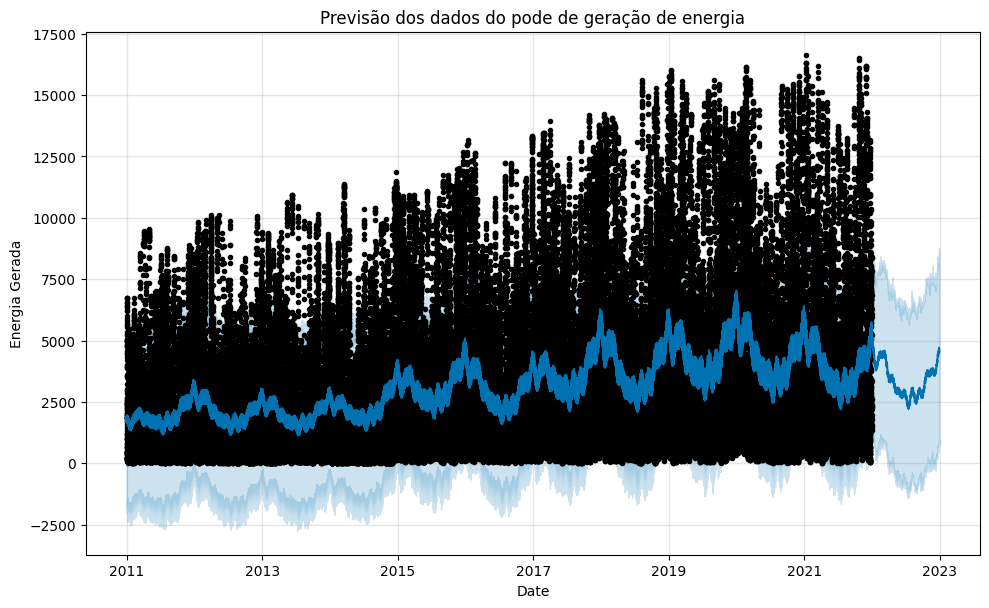

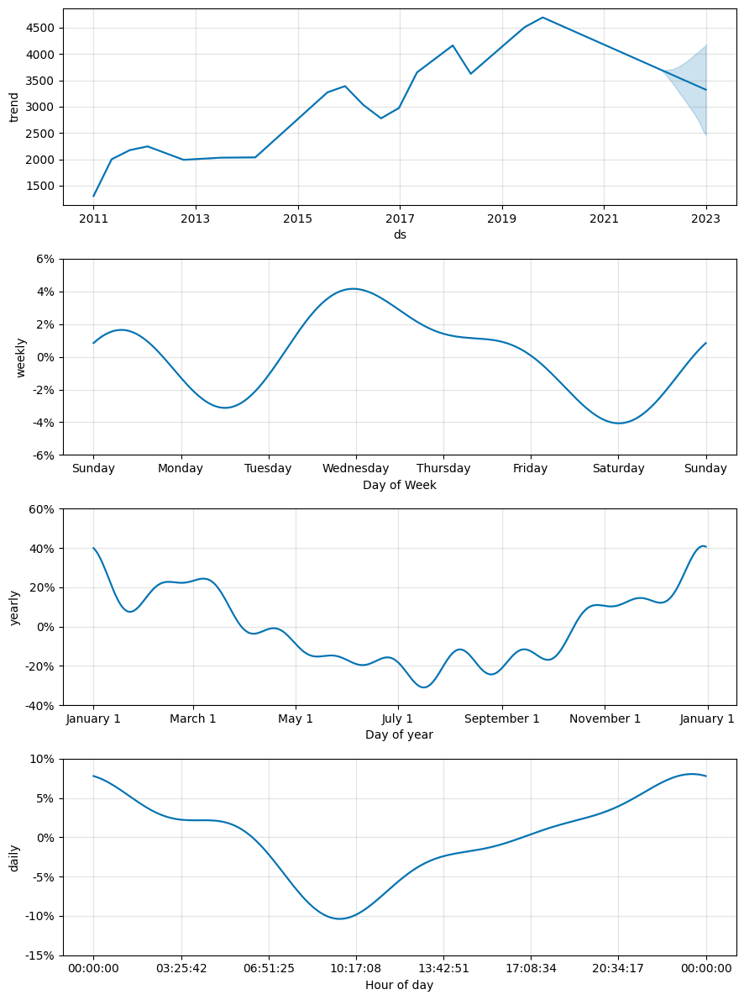

In [61]:
future = m.make_future_dataframe(periods=365, freq='D')
forecast=m.predict(future)
m.plot(forecast)
plt.title("Previsão dos dados do pode de geração de energia")
plt.xlabel("Date")
plt.ylabel("Energia Gerada")
plt.show()
figu2=m.plot_components(forecast)

In [ ]:
# importar pacotes necessários
from prophet.diagnostics import cross_validation

#criamos o dataframe de validação
df_cv = cross_validation(m, period="30 days", horizon="180 days")

INFO:prophet:Making 110 forecasts with cutoffs between 2012-07-20 07:00:00 and 2021-07-03 07:00:00


  0%|          | 0/110 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpq8pyisg4/ibpvpswd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpq8pyisg4/3y4dwz45.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34281', 'data', 'file=/tmp/tmpq8pyisg4/ibpvpswd.json', 'init=/tmp/tmpq8pyisg4/3y4dwz45.json', 'output', 'file=/tmp/tmpq8pyisg4/prophet_modelhf2zq6qp/prophet_model-20240329130119.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:01:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:01:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpq8pyisg4/w6j9os65.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpq8pyisg4/tp_bn2kl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

In [ ]:
# importar pacotes
from prophet.plot import plot_cross_validation_metric
from prophet.diagnostics import performance_metrics

# extrair métricas de desempenho
df_p = performance_metrics(df_cv)
display(df_p)
# exibir métricas de desempenho em um gráfico
#fig = plot_cross_validation_metric(df_cv, metric='mape')

#mape = mean_absolute_percentage_error(test['y'],test_forecast['yhat'])
#print("MAPE",round(mape,2),"%")

In [ ]:
# definindo uma data de corte
data_fim = '2021-12-20'
# definindo os dados de treino, antes da data de corte
train = series.loc[series['ds'] <= data_fim]
# definindo os dados de teste posterior a data de corte
test = series.loc[series['ds'] > data_fim]

In [ ]:
print(len(train))
print(len(test))

In [ ]:
# definindo o tamanho do plot
f, ax = plt.subplots(figsize=(14,5))
# plotando os dados de treino
train.plot(kind='line', x='ds', y='y', color='blue', label='Train', ax=ax)
# plotando os dados de teste
test.plot(kind='line', x='ds', y='y', color='red', label='Test', ax=ax)
# definindo o título
plt.title('Valor médio nos dados de treino e teste');

In [ ]:
# criando a função MAPE
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Função para calcular o MDAPE
def calculate_mdape(y_true, y_pred):
    absolute_percentage_errors = np.abs((y_true - y_pred) / y_true)
    return np.median(absolute_percentage_errors) * 100

# Função para calcular o sMAPE
def calculate_smape(y_true, y_pred):
    absolute_percentage_errors = np.abs(y_true - y_pred) / ((np.abs(y_true) + np.abs(y_pred)) / 2)
    return np.mean(absolute_percentage_errors) * 100

In [ ]:
import numpy as np

# Função para calcular o MAPE
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    mask = y_true != 0  # Evita divisão por zero
    return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100

# Função para calcular o MDAPE
def calculate_mdape(y_true, y_pred):
    absolute_percentage_errors = np.abs((y_true - y_pred) / y_true)
    mask = ~np.isnan(absolute_percentage_errors)  # Remove valores "nan"
    return np.median(absolute_percentage_errors[mask]) * 100

# Função para calcular o sMAPE
def calculate_smape(y_true, y_pred):
    absolute_percentage_errors = np.abs(y_true - y_pred) / ((np.abs(y_true) + np.abs(y_pred)) / 2)
    mask = ~np.isnan(absolute_percentage_errors)  # Remove valores "nan"
    return np.mean(absolute_percentage_errors[mask]) * 100

# Função para calcular o GMPE
def geometric_mean_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    mask = y_true != 0  # Evita divisão por zero
    percentage_errors = np.abs((y_true[mask] - y_pred[mask]) / y_true[mask]) * 100
    return np.exp(np.mean(np.log(1 + percentage_errors))) - 1


def symmetric_weighted_absolute_percentage_error(y_true, y_pred, weights=None):
    y_true, y_pred = np.array(y_true), np.array(y_pred)

    if weights is None:
        weights = np.ones_like(y_true)
    else:
        weights = np.array(weights)

    absolute_percentage_errors = np.abs(y_true - y_pred) / np.maximum(np.abs(y_true) + np.abs(y_pred), np.finfo(float).eps)

    return np.sum(weights * absolute_percentage_errors) / np.sum(weights) * 100

# Função para calcular o RMSPE
def root_mean_square_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    percentage_errors = ((y_true - y_pred) / y_true) * 100
    return np.sqrt(np.mean(percentage_errors**2))

# Função para calcular o MASE
def mean_absolute_scaled_error(y_true, y_pred, seasonality):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    n = len(y_true)
    errors = np.abs(y_true - y_pred)
    scale = np.sum(np.abs(y_true[seasonality:] - y_true[:-seasonality])) / (n - seasonality)
    return np.mean(errors / scale)

In [ ]:
# contando a quantidade de dias à frente para checar a acurácia da previsão
dias_a_prever = len(test.ds.unique())
# checando a quantidade de dias
dias_a_prever

In [ ]:
# instanciando o modelo
m = Prophet()
# realizando o treinamento
m.fit(train)
# método auxiliar para previsão
future = m.make_future_dataframe(periods=dias_a_prever)
# previsão do modelo
forecast = m.predict(future)
# olhando os resultados das previsões com os dados de treino
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

In [ ]:
# fazendo previsões com os dados de teste
test_forecast = m.predict(test)
# olhando os resultados das previsões com os dados de teste
test_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(7)

In [ ]:
# configurando a área de plotagem
fig, ax = plt.subplots(1)
# alterando a altura
fig.set_figheight(5)
# alterando a largura
fig.set_figwidth(15)
# adicionando os dados de teste
ax.scatter(test.ds, test['y'], color='r')
# plotando o gráfico
fig = m.plot(test_forecast, ax=ax)
# definindo o título
plt.title('Previsões com os dados de teste');

In [ ]:
# configurando a área de plotagem
f, ax = plt.subplots(figsize=(14,5))
# alterando a altura
f.set_figheight(5)
# alterando a largura
f.set_figwidth(15)
# plotando o gráfico com dados de teste
test.plot(kind='line',x='ds', y='y', color='red', label='Test', ax=ax)
# plotando o gráfico com os dados previstos
test_forecast.plot(kind='line',x='ds',y='yhat', color='green',label='Forecast', ax=ax)
# definindo o título
plt.title('Dados de teste vs Previsões');

In [ ]:
from sklearn.metrics import mean_squared_error
mape = mean_absolute_percentage_error(test['y'],test_forecast['yhat'])
mdape = calculate_mdape(test['y'],test_forecast['yhat'])
gmpe = geometric_mean_percentage_error(test['y'],test_forecast['yhat'])
smape = calculate_smape(test['y'],test_forecast['yhat'])
swape = symmetric_weighted_absolute_percentage_error(test['y'],test_forecast['yhat'])
rmspe = root_mean_square_percentage_error(test['y'],test_forecast['yhat'])
mase = mean_absolute_scaled_error(test['y'],test_forecast['yhat'],seasonality=12)
mae = mean_absolute_error(test['y'],test_forecast['yhat'])
mse = mean_squared_error(test['y'],test_forecast['yhat'], squared=True)
rmse=mean_squared_error(test['y'],test_forecast['yhat'], squared=False)
print("MAE",round(mae,2))
print("MSE",round(mse,2))
print("MAPE",round(mape),"%")
print("MDAPE",round(mdape,2),"%")
print("SMAPE",round(smape,2),"%")
print("GMPE",round(gmpe,2))
print("RMSPE",round(rmspe,2),"%")
print("MASE",round(mase,2))
print("SWAPE",round(swape,2),"%")
print("RMSE",round(rmse,2))

# **NeuralProphet**

# **Bibliotecas**

In [ ]:
#https://medium.com/analytics-vidhya/time-series-tutorial-using-neuralprophet-e918a1b437ed

In [ ]:
# Installing NeuralProphet
!pip install neuralprophet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 145.4/145.4 kB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 21.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 70.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 829.5/829.5 kB 60.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.4/840.4 kB 56.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 345.4/345.4 kB 30.5 MB/s eta 0:00:00
  Attempting uninstall: pandas
    Found existing installation: pandas 1.5.3
    Uninstalling pandas-1.5.3:
      Successfully uninstalled pandas-1.5.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 0.21.0 requires pandas<2.1.4,>=1.5.0, but you have pandas 2.2.1 which is incompatible.
google-colab 1.0.0 requires pandas==1.5.3, but you have pandas 2.2.1 which is incompa

# **Preparação**

In [ ]:
import seaborn as sns
from neuralprophet import NeuralProphet
import pandas as pd
from pandas import read_excel
from pandas import DataFrame
import matplotlib.pyplot as plt
import warnings
from math import sqrt
from prophet import Prophet
import numpy as np
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

db = pd.read_csv('/content/drive/MyDrive/archive/data.csv' ,header=0, parse_dates=True, index_col=0).squeeze(1)

# Exibindo os dados do arquivo
db

Time
2011-01-01 00:00:00    3416.00
2011-01-01 00:15:00    4755.00
2011-01-01 00:30:00    4939.00
2011-01-01 00:45:00    4939.00
2011-01-01 01:00:00    4998.00
                        ...   
2021-12-30 06:45:00    8140.31
2021-12-30 07:00:00    8162.33
2021-12-30 07:15:00    8405.11
2021-12-30 07:30:00    8503.48
2021-12-30 07:45:00    8403.53
Name: MW, Length: 385566, dtype: float64

In [ ]:
db = db.reset_index(drop=False)
db.index = db.index.astype(int)

db.rename(columns={'Time': 'ds'}, inplace=True)
db.rename(columns={'MW': 'y'}, inplace=True)

db['ds'] = pd.to_datetime(db['ds'])

# Definindo a coluna 'data' como o índice do DataFrame
db.set_index('ds', inplace=True)



db

,y
ds,
2011-01-01 00:00:00,3416.00
2011-01-01 00:15:00,4755.00
2011-01-01 00:30:00,4939.00
2011-01-01 00:45:00,4939.00
2011-01-01 01:00:00,4998.00
...,...
2021-12-30 06:45:00,8140.31
2021-12-30 07:00:00,8162.33
2021-12-30 07:15:00,8405.11


In [ ]:
db.replace(0, np.nan, inplace=True)

# Removendo as linhas com valores nulos
db = db.dropna()

db

,y
ds,
2011-01-01 00:00:00,3416.00
2011-01-01 00:15:00,4755.00
2011-01-01 00:30:00,4939.00
2011-01-01 00:45:00,4939.00
2011-01-01 01:00:00,4998.00
...,...
2021-12-30 06:45:00,8140.31
2021-12-30 07:00:00,8162.33
2021-12-30 07:15:00,8405.11


In [ ]:
import pandas as pd


if db.isnull().values.any():
  print("O DataFrame contém valores NaN. Removendo linhas...")
  db = db.dropna()
  print("Linhas com valores NaN foram removidas.")
else:
  print("Não há valores NaN no DataFrame.")

db

Não há valores NaN no DataFrame.


,y
ds,
2011-01-01 00:00:00,3416.00
2011-01-01 00:15:00,4755.00
2011-01-01 00:30:00,4939.00
2011-01-01 00:45:00,4939.00
2011-01-01 01:00:00,4998.00
...,...
2021-12-30 06:45:00,8140.31
2021-12-30 07:00:00,8162.33
2021-12-30 07:15:00,8405.11


In [ ]:
db = db.resample('1H').mean()
db

,y
ds,
2011-01-01 00:00:00,4512.2500
2011-01-01 01:00:00,5240.2500
2011-01-01 02:00:00,5630.2500
2011-01-01 03:00:00,6017.7500
2011-01-01 04:00:00,6357.0000
...,...
2021-12-30 03:00:00,6274.9800
2021-12-30 04:00:00,6865.0150
2021-12-30 05:00:00,7829.0325


In [ ]:
import pandas as pd


if db.isnull().values.any():
  print("O DataFrame contém valores NaN. Removendo linhas...")
  db = db.dropna()
  print("Linhas com valores NaN foram removidas.")
else:
  print("Não há valores NaN no DataFrame.")

db

O DataFrame contém valores NaN. Removendo linhas...
Linhas com valores NaN foram removidas.


,y
ds,
2011-01-01 00:00:00,4512.2500
2011-01-01 01:00:00,5240.2500
2011-01-01 02:00:00,5630.2500
2011-01-01 03:00:00,6017.7500
2011-01-01 04:00:00,6357.0000
...,...
2021-12-30 03:00:00,6274.9800
2021-12-30 04:00:00,6865.0150
2021-12-30 05:00:00,7829.0325


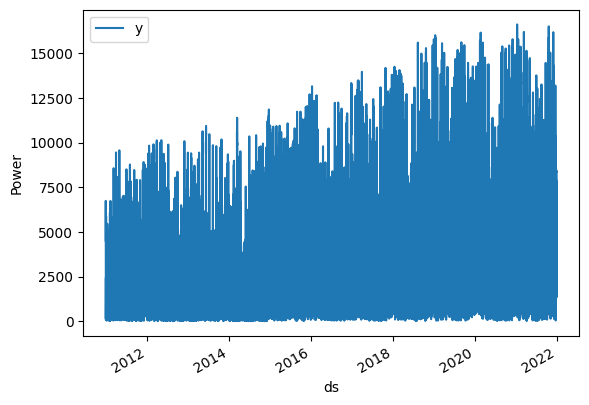

In [ ]:
ax = db.plot()
ax.set_ylabel('Power')
plt.show()

In [ ]:
db = db.reset_index(drop=False)
db.index = db.index.astype(int)

db.rename(columns={'ds': 'ds'}, inplace=True)
db.rename(columns={'y': 'y'}, inplace=True)
db

,ds,y
0,2011-01-01 00:00:00,4512.2500
1,2011-01-01 01:00:00,5240.2500
2,2011-01-01 02:00:00,5630.2500
3,2011-01-01 03:00:00,6017.7500
4,2011-01-01 04:00:00,6357.0000
...,...,...
96363,2021-12-30 03:00:00,6274.9800
96364,2021-12-30 04:00:00,6865.0150
96365,2021-12-30 05:00:00,7829.0325
96366,2021-12-30 06:00:00,8421.9200


(array([-3653.,     0.,  3652.,  7305., 10957., 14610., 18262., 21915.]),
 [Text(0, -3653.0, '1960'),
  Text(0, 0.0, '1970'),
  Text(0, 3652.0, '1980'),
  Text(0, 7305.0, '1990'),
  Text(0, 10957.0, '2000'),
  Text(0, 14610.0, '2010'),
  Text(0, 18262.0, '2020'),
  Text(0, 21915.0, '2030')])

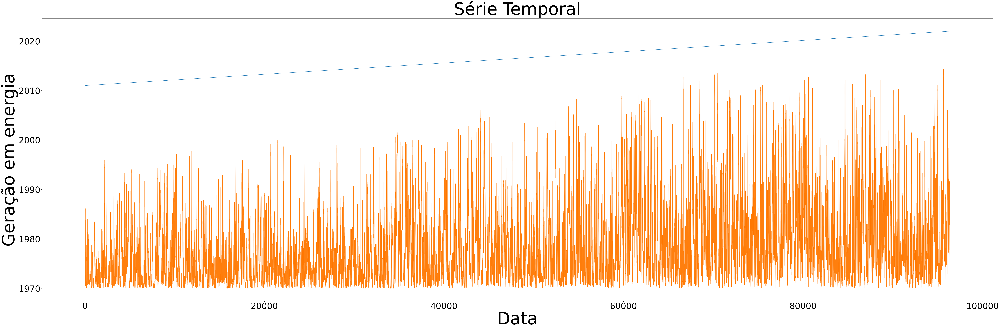

In [ ]:
import matplotlib.pyplot as plt
db.plot(kind='line',figsize=(100,30))
plt.title("Série Temporal",fontsize = 100)
plt.xlabel('Data',fontsize = 100)
plt.ylabel('Geração em energia',fontsize = 100)
plt.legend().remove()
plt.xticks(fontsize = 50)
plt.yticks(fontsize = 50)

# **Previsão**

In [ ]:
m = NeuralProphet()
df_train, df_val = m.split_df(db, freq='M', valid_p = 0.2)
metrics = m.fit(df_train, freq='M', validation_df=df_val)

INFO - (NP.df_utils._infer_frequency) - Major frequency H corresponds to 99.979% of the data.
INFO:NP.df_utils:Major frequency H corresponds to 99.979% of the data.
WARNING - (NP.df_utils._infer_frequency) - Defined frequency M is different than major frequency H
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency H corresponds to 99.977% of the data.
INFO:NP.df_utils:Major frequency H corresponds to 99.977% of the data.
WARNING - (NP.df_utils._infer_frequency) - Defined frequency M is different than major frequency H
INFO - (NP.config.init_data_params) - Setting normalization to global as only one datafr

Finding best initial lr:   0%|          | 0/272 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

In [ ]:
future = m.make_future_dataframe(db, periods=24, n_historic_predictions=len(db))
forecast = m.predict(future)

INFO - (NP.df_utils._infer_frequency) - Major frequency H corresponds to 99.979% of the data.
INFO:NP.df_utils:Major frequency H corresponds to 99.979% of the data.
WARNING - (NP.df_utils._infer_frequency) - Defined frequency M is different than major frequency H
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency H corresponds to 99.954% of the data.
INFO:NP.df_utils:Major frequency H corresponds to 99.954% of the data.
WARNING - (NP.df_utils._infer_frequency) - Defined frequency M is different than major frequency H
INFO - (NP.df_utils._infer_frequency) - Major frequency H corresponds to 99.954% of the data.
INFO:NP.df_utils:Major frequency H corresponds to 99.954% of the data.
WARNING - (NP.df_utils._infer_frequency) - Defined frequency M is different than major frequency H
INFO - (NP.data.processing._handle_missing_data) - Dropped 24 rows at the end

Predicting: 302it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column


In [ ]:
pip install plotly

In [ ]:
import pandas as pd
pd.options.plotting.backend = "plotly"
fig_forecast = m.plot(forecast)
fig_components = m.plot_components(forecast)
fig_model = m.pd.plot_parameters()

WARNING - (NP.plotting.log_warning_resampler_switch_to_valid_env) - Warning: plotly-resampler not supported for the environment you are using. Plotting backend automatically switched to 'plotly' without resampling 
WARNING - (NP.plotting.log_warning_resampler_switch_to_valid_env) - Warning: plotly-resampler not supported for the environment you are using. Plotting backend automatically switched to 'plotly' without resampling 


AttributeError: 'NeuralProphet' object has no attribute 'pd'

# **Comparação**

In [ ]:
#Testststststststtsts